In [1]:
import sys
import os
sys.path.append("../src/")
import combat
import numpy as np
import scipy.stats as stats
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
import sklearn
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sb
import pickle as pkl
from sklearn.linear_model import LogisticRegression, Lasso, Ridge, ElasticNet
import random as rd
import matplotlib
matplotlib.rcParams['figure.dpi'] = 500
from sklearn.preprocessing import quantile_transform,binarize
from sklearn.model_selection import LeaveOneOut,KFold
from sklearn.metrics import r2_score
from statsmodels.stats.multitest import multipletests
from sklearn.cross_decomposition import PLSRegression as PLS
import warnings
warnings.simplefilter("ignore")
from multiprocessing import Process,Queue,Pool
import time 
import helper
from multiprocessing import set_start_method
#set_start_method("spawn")
from DecoID.DecoID import flatten
from sklearn.cross_decomposition import PLSRegression
from sklearn.svm import SVC
import importlib
import helper#import the module here, so that it can be reloaded.
importlib.reload(helper)
from statsmodels.stats.anova import AnovaRM
from statsmodels.stats.multitest import multipletests
from collections import namedtuple
from scipy import special

def welch_anova_np(*args, var_equal=False):
    # https://svn.r-project.org/R/trunk/src/library/stats/R/oneway.test.R
    # translated from R Welch ANOVA (not assuming equal variance)

    F_onewayResult = namedtuple('F_onewayResult', ('statistic', 'pvalue'))

    args = [np.asarray(arg, dtype=float) for arg in args]
    k = len(args)
    ni =np.array([len(arg) for arg in args])
    mi =np.array([np.mean(arg) for arg in args])
    vi =np.array([np.var(arg,ddof=1) for arg in args])
    wi = ni/vi

    tmp =sum((1-wi/sum(wi))**2 / (ni-1))
    tmp /= (k**2 -1)

    dfbn = k - 1
    dfwn = 1 / (3 * tmp)

    m = sum(mi*wi) / sum(wi)
    f = sum(wi * (mi - m)**2) /((dfbn) * (1 + 2 * (dfbn - 1) * tmp))
    prob = special.fdtrc(dfbn, dfwn, f)   # equivalent to stats.f.sf
    return F_onewayResult(f, prob)

In [2]:
var_imp = pd.read_csv("../data/var_importance_final_updated_6_23.csv",index_col=0)
var_imp

,var_imp,plot-name
HSSpos_Cer_NS d18:1_16:0_17.788,0.001118,Cer-NS d18:1_16:0
HSSpos_Cer_NS d18:2_16:0_16.67,0.000905,Cer-NS d18:2_16:0
HSSpos_LPC 0:0/16:0_4.715,-0.000702,LPC 0:0/16:0
HSSpos_LPC 0:0/18:0_6.997,-0.001206,LPC 0:0/18:0
HSSpos_LPC 14:0/0:0_3.387,-0.000405,LPC 14:0/0:0
HSSpos_LPC 16:0/0:0_5.147,-0.000232,LPC 16:0/0:0
HSSpos_LPC 16:1/0:0_3.734,0.000187,LPC 16:1/0:0
HSSpos_LPC 17:0/0:0_6.28,-0.000472,LPC 17:0/0:0
HSSpos_LPC 18:0/0:0_7.547,-0.000484,LPC 18:0/0:0
HSSpos_LPC 18:1/0:0_5.589,-0.000179,LPC 18:1/0:0


In [3]:
#load in metadata and peak areas and associate

#read in peak data
datafilename = "../data/QTof-B1-9_pHILIC_HSS_pos-neg_normalized.csv"
data = pd.read_csv(datafilename)

#get area columns
areaCols = data.columns.values[10:]

#get molecule names
mol_names = data["Compound Name"].values

#extract area data and transpose
areaData = data[areaCols].transpose()

#get batch information
batchInfo = [int(x.split("_")[0][1]) for x in list(areaData.index.values)]

areaData = areaData.to_numpy()
areaData = areaData.astype(np.float)

#get index of blanks
blankSamp = [x for x in range(len(areaCols)) if "Blank" in areaCols[x] and not "equil" in areaCols[x]]
print(len(blankSamp)," blanks")

#get index of qc
qcSamp = [x for x in range(len(areaCols)) if "NIST" in areaCols[x] and not "equil" in areaCols[x] ]
print(len(qcSamp)," qc samples")

#get index of wu350 samples
samp = [x for x in range(len(areaCols)) if "WU350" in areaCols[x] and not "equil" in areaCols[x]]
print(len(samp), "research samples")

#load in metadata
metadatafn = "../data/Experiment-Parameters_b1-9_updated_5_25_21_drug_annotation_excluded_6_23_21.csv"
metadata = pd.read_csv(metadatafn)

measurement_data = pd.read_csv("../data/PMN_CRP_d-dimer_CO2_Comorbidities_updated_all_data_rel_cyto_new_comorb_6_23_21.csv",index_col=0)

#extact sample names for d0_yes samples
metadata_rel = metadata[metadata["day-COVID"] == "d0_Yes"]
print(len(metadata_rel)," d0 Covid+ Samples")

metadata_val = metadata[metadata["day-COVID"] == "d0_No"]
print(len(metadata_val), "d0 Covid- Samples")

val_samples = []
for index,row in metadata_val.iterrows():
    if measurement_data.at[row["WU-350"],"Any drug"] < .5:
        val_samples.append(row["Sample General Name"])
    
val_cols = []
for val_s in val_samples:
    for col in range(len(areaCols)):
        if areaCols[col] == val_s:
            val_cols.append(col)
            break
            
#create sample name, ventilator status linkage
vent_dict = {}
metadata_dict = {}
for index,row in metadata_rel.iterrows():
    val = str(row["ICU"])
    sampName = row["Sample General Name"]
    if "es" in val:
        val = 1
    elif "o" in val:
        val = 0
    vent_dict[sampName] = val
    metadata_dict[sampName] = row

print(np.sum(list(vent_dict.values()))," ICU+ samples")
print(len(vent_dict) - np.sum(list(vent_dict.values())),"ICU- samples")

#link vent status to sample in peak data
vent_status = []
metadata_for_samples = []
patient_ids = []
for s in np.array(areaCols)[samp]:
    tmp = s
    if tmp in vent_dict:
        vent_status.append(vent_dict[tmp])
        metadata_for_samples.append(metadata_dict[tmp])
        patient_ids.append(metadata_dict[tmp]["WU-350"])
    else:
        vent_status.append(-1)
        metadata_for_samples.append(-1)
print("found vent info for",len([x for x in vent_status if x != -1]),"covid_ d0 samples")
samplesOfInterest = [x for x in range(len(vent_status)) if vent_status[x] != -1]

sampleInfoDict = {}
for index,row in metadata.iterrows():
    if row["WU-350"] in patient_ids:
        val = str(row["ICU"])
        if "es" in val:
            val = 1
        elif "o" in val:
            val = 0
        
        sampleInfoDict[row["Sample General Name"]] = {"patient":row["WU-350"],"ICU":val,
                                                      "Day_to_ICU":row["Epic: Time from symptom onset to ICU (days)"],
                                                     "sample_day":row["WU350-Symptom onset"],
                                                      "death":row["Mortality Status"],
                                                     "collection_day":row["WU day of presentation"]}

index = 0
samplesOfInterest = []
for s in np.array(areaCols)[samp]:
    tmp = s
    if tmp in sampleInfoDict:
        samplesOfInterest.append(index)
        sampleInfoDict[tmp]["index"] = index
    index += 1
    
sampleInfoDict = {key:val for key,val in sampleInfoDict.items() if "index" in val}
sampleInfoDict = pd.DataFrame.from_dict(sampleInfoDict,orient="index")
print("found logitudinal info for: ",len(sampleInfoDict))

tmp = sampleInfoDict[sampleInfoDict["ICU"] == 1]
tmp = tmp[tmp["Day_to_ICU"] == "None"]
sampleInfoDict = sampleInfoDict.drop(tmp.index.values,axis=0)


#create sample matrix
samp_int = np.log2(areaData[samp])

val_int = np.log2(areaData[val_cols])


vars_of_interest = []
for x in var_imp.index.values:
    index = 0
    for y in mol_names:
        if x == y:
            vars_of_interest.append(index)
            break
        index += 1 
        
samp_int = samp_int[:,vars_of_interest]
val_int = val_int[:,vars_of_interest]
print(samp_int.shape)
print(val_int.shape)

0  blanks
0  qc samples
706 research samples
263  d0 Covid+ Samples
59 d0 Covid- Samples
123  ICU+ samples
140 ICU- samples
found vent info for 263 covid_ d0 samples
found logitudinal info for:  603
(706, 22)
(45, 22)


0.9361702127659575
47
(17, 25)
[89.03  6.57]


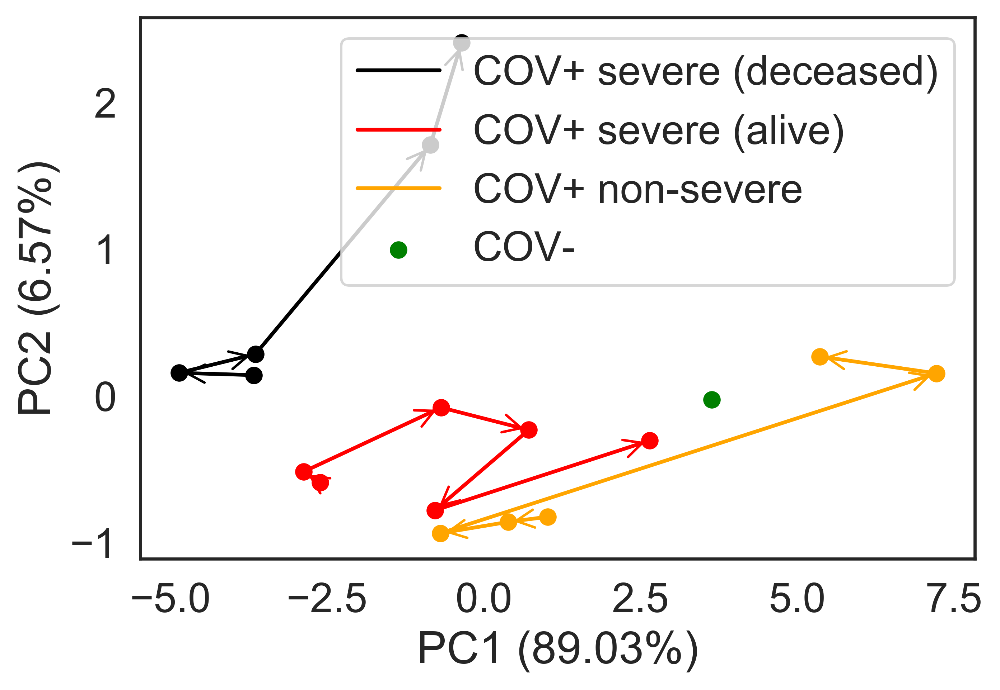

In [17]:
cov_minus = np.mean(val_int,axis=0)

labels = ["COV-"]
data_mat = [cov_minus]

days = ["d0","d3","d7","d14","d28","d84"]

tmp = [row["ICU"] for index,row in sampleInfoDict.iterrows() if row["collection_day"]=="d0" and row["death"] == "Deceased"]

print(np.sum(tmp)/len(tmp))
print(len(tmp))


for day in days:
    #get COV+ deceased

    relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["collection_day"]==day and row["death"] == "Deceased" and row["ICU"] > .5 and measurement_data.at[row["patient"],"Any drug"] < .5]
    if len(relsamples) > 0:
        tmp = [np.mean(samp_int[relsamples,:],axis=0)]
        #tmp = samp_int[relsamples,:].tolist()
        data_mat += tmp
        [labels.append("COV+ severe (deceased) " + day) for _ in range(len(tmp))]

    #get COV+ severe (alive)

    relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["collection_day"]==day and row["death"] == "Alive" and row["ICU"] > .5 and measurement_data.at[row["patient"],"Any drug"] < .5]
    if len(relsamples) > 0:
        tmp = [np.mean(samp_int[relsamples,:],axis=0)]
        #tmp = samp_int[relsamples,:].tolist()
        data_mat += tmp
        [labels.append("COV+ severe (alive) " + day) for _ in range(len(tmp))]

    #get COV+ non-severe (alive)
    relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["collection_day"]==day and row["ICU"] < .5 and measurement_data.at[row["patient"],"Any drug"] < .5]
    if len(relsamples) > 0:
        tmp = [np.mean(samp_int[relsamples,:],axis=0)]
        #tmp = samp_int[relsamples,:].tolist()
        data_mat += tmp
        [labels.append("COV+ non-severe " + day) for _ in range(len(tmp))]

data_mat = np.array(data_mat)

pca = PCA(n_components=2)

loads = pca.fit_transform(data_mat)
print(data_mat.shape)
var_explained = np.round(100*pca.explained_variance_ratio_,2)
print(var_explained)

plt.scatter([loads[0][0]],loads[0][1],label=labels[0],color="green")

for group,color in zip(["COV+ severe (deceased)","COV+ severe (alive)","COV+ non-severe"],["black","red","orange"]):
    line_dict = {d:[] for d in days}
    for day in days:
        for load,label in zip(loads,labels):
            if group in label and day in label:
                line_dict[day].append(load)
    xcoords = []
    ycoords = []
    
    goodDays = []
    for day in days:
        if len(line_dict[day]) > 0:
            goodDays.append(day)
    
    day = goodDays[0]
    xcoords.append(np.mean(np.array(line_dict[day])[:,0]))
    ycoords.append(np.mean(np.array(line_dict[day])[:,1]))
    plt.scatter([xcoords[-1]],[ycoords[-1]],color=color)
    a = np.mean(np.array(line_dict[goodDays[0]]),axis=0)
    b = np.mean(np.array(line_dict[goodDays[1]]),axis=0)
    diff = np.subtract(b,a)
    plt.annotate("", xy=a + diff, xytext=a,arrowprops=dict(arrowstyle="->",color=color))
    
    for x in range(1,len(goodDays)-1):
        xcoords.append(np.mean(np.array(line_dict[goodDays[x]])[:,0]))
        ycoords.append(np.mean(np.array(line_dict[goodDays[x]])[:,1]))
        a = np.mean(np.array(line_dict[goodDays[x]]),axis=0)
        b = np.mean(np.array(line_dict[goodDays[x+1]]),axis=0)
        diff = np.subtract(b,a)
        plt.scatter([xcoords[-1]],[ycoords[-1]],color=color,marker="o")
        plt.annotate("", xy=a + diff, xytext=a,arrowprops=dict(arrowstyle="->",color=color))

        
    day = goodDays[-1]
    xcoords.append(np.mean(np.array(line_dict[day])[:,0]))
    ycoords.append(np.mean(np.array(line_dict[day])[:,1]))
    plt.scatter([xcoords[-1]],[ycoords[-1]],color=color,marker="o")
    
    plt.plot(xcoords,ycoords,color=color,label=group)
    plt.xlabel("PC1 (" + str(var_explained[0]) + "%)",fontfamily = "Arial")
    plt.ylabel("PC2 (" + str(var_explained[1]) + "%)",fontfamily = "Arial")

plt.legend(prop={'family': 'Arial'})





In [18]:
days = ["d0","d3","d7","d14","d28","d84"]

ind = 0

plot_df = {}

for day in days:
    #get COV+ deceased
    for met in range(len(var_imp)):

        norm = np.mean(val_int[:,met])

        
        relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["collection_day"]==day and row["death"] == "Deceased" and row["ICU"] > .5 and measurement_data.at[row["patient"],"Any drug"] < .5]
        if len(relsamples) > 0:
            tmp = samp_int[relsamples,met]
            for x in tmp:
                plot_df[ind] = {"metabolite":var_imp.at[var_imp.index.values[met],"plot-name"],"group":"COV+ severe (deceased)","day":day,"intensity":x/norm}
                ind += 1
                

        #get COV+ severe (alive)

        relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["collection_day"]==day and row["death"] == "Alive" and row["ICU"] > .5 and measurement_data.at[row["patient"],"Any drug"] < .5]
        if len(relsamples) > 0:
            tmp = samp_int[relsamples,met]
            for x in tmp:
                plot_df[ind] = {"metabolite":var_imp.at[var_imp.index.values[met],"plot-name"],"group":"COV+ severe (alive)","day":day,"intensity":x/norm}
                ind += 1

        #get COV+ non-severe (alive)

        relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["collection_day"]==day and row["ICU"] < .5 and measurement_data.at[row["patient"],"Any drug"] < .5]
        if len(relsamples) > 0:
            tmp = samp_int[relsamples,met]
            for x in tmp:
                plot_df[ind] = {"metabolite":var_imp.at[var_imp.index.values[met],"plot-name"],"group":"COV+ non-severe","day":day,"intensity":x/norm}
                ind += 1
                
        tmp = val_int[:,met]
        for x in tmp:
            plot_df[ind] = {"metabolite":var_imp.at[var_imp.index.values[met],"plot-name"],"group":"COV-","day":day,"intensity":x/norm}
            ind += 1

plot_df = pd.DataFrame.from_dict(plot_df,orient="index")


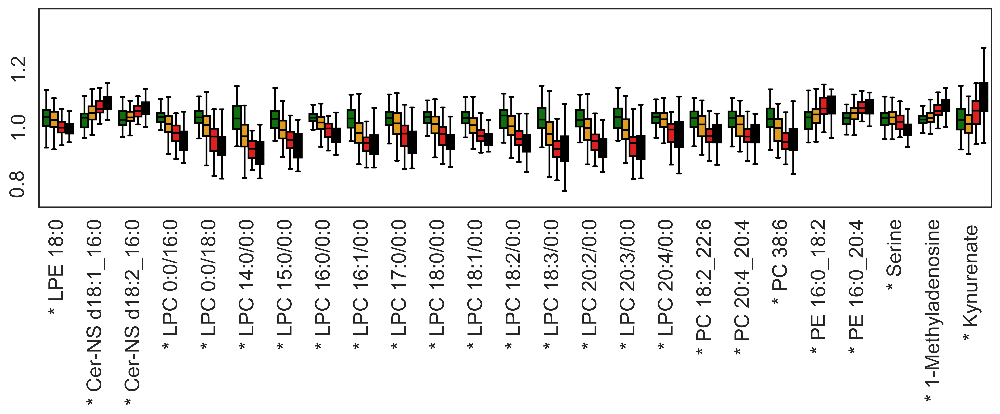

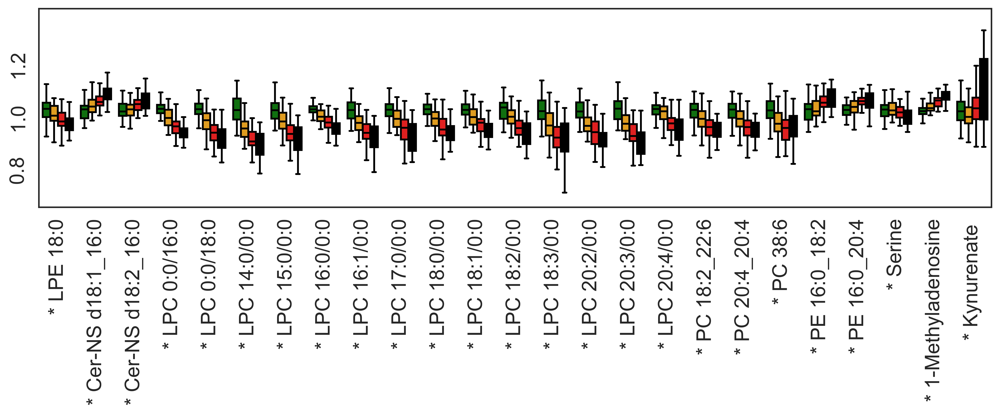

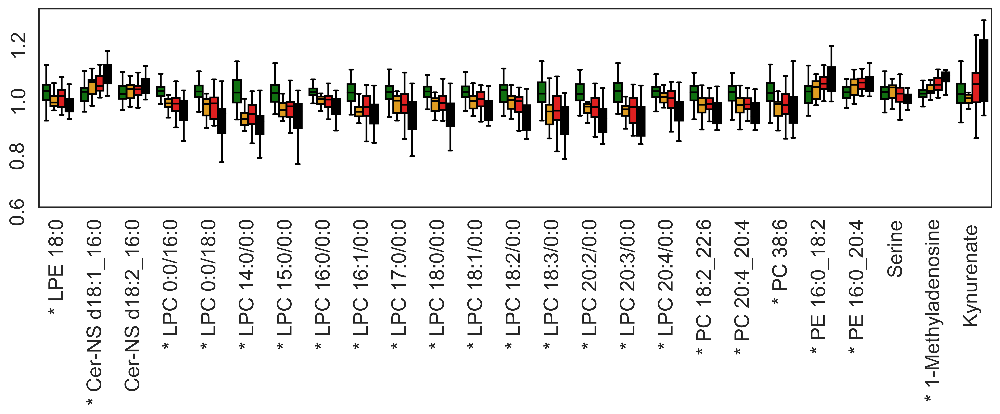

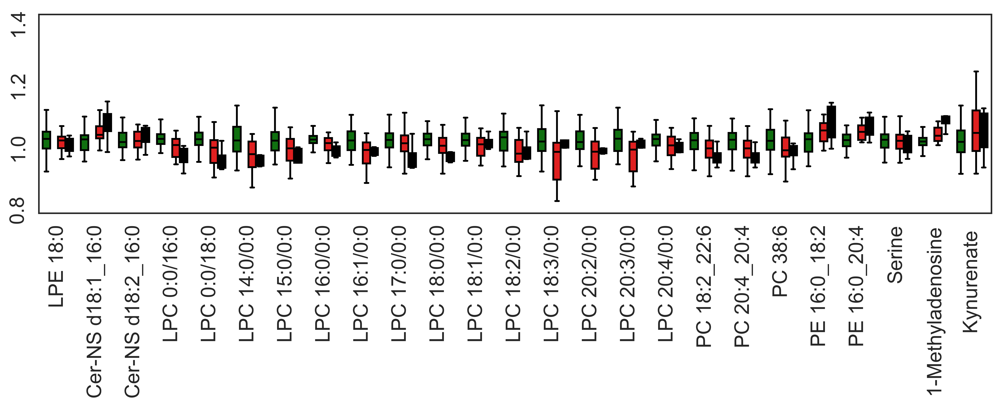

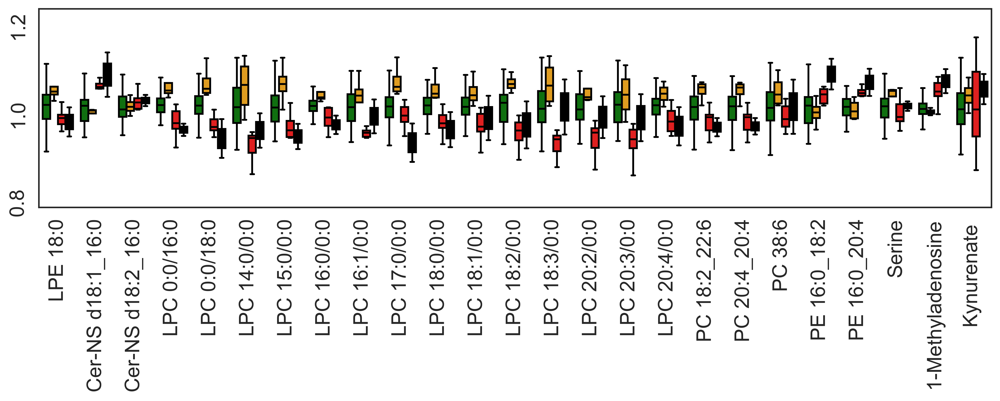

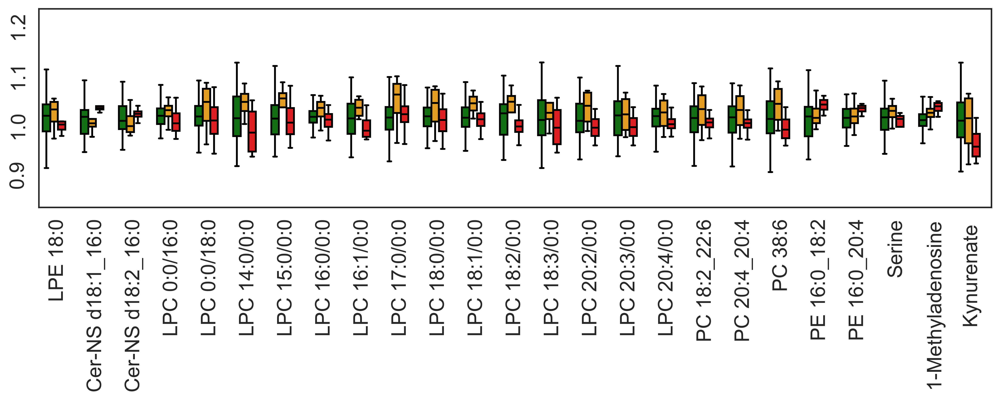

In [19]:


names = []
ds = []
p_vals = []
alpha = 0.05
for plot_day in days:
    filt = plot_df[plot_df["day"] == plot_day]
    groups = ["COV-","COV+ non-severe","COV+ severe (alive)","COV+ severe (deceased)"]
    #groups = ["COV+ severe (alive)","COV+ (deceased)"]
    palette = {"COV+ non-severe":"orange","COV+ severe (alive)":"red","COV+ severe (deceased)":"black","COV-":"green"}


    for met in var_imp["plot-name"].values:
        filt_filt = filt[filt["metabolite"] == met]
        args = []
        for group in groups:
            tmp = filt_filt[filt_filt["group"] == group]["intensity"].values
            args.append(tmp)
        if all(len(x) > 3 for x in args):
            stat,p = welch_anova_np(*args)
            p_vals.append(p)
            names.append(met)
            ds.append(plot_day)
reject,pvals_corr,_,_ = multipletests(p_vals,alpha,method="fdr_bh")
sig_df = {}
ind = 0
for name,p,d in zip(names,pvals_corr,ds):
    if p < alpha:
        sig_df[ind] = {"p (corr)":p,"metabolite":name,"day":d}
        ind += 1
sig_df = pd.DataFrame.from_dict(sig_df,orient="index")    
for d in days:
    filt = sig_df[sig_df["day"] == d]
#    if len(filt) > 0:
    tmp = plot_df[plot_df["day"] == d]
    sig_mets = list(set(filt["metabolite"].values))
    for index,row in tmp.iterrows():
        if row["metabolite"] in sig_mets:
            tmp.at[index,"metabolite"] = "* " + row["metabolite"]
#    toDrop = []
#         for index,row in tmp.iterrows():
#             if row["metabolite"] not in filt["metabolite"].values:
#                 toDrop.append(index)
#    tmp = tmp.drop(toDrop)
    sb.set(font_scale=1.5,font="Arial",style="white")
    plt.figure(figsize=(14,3))
    sb.boxplot(data=tmp,x="metabolite",y="intensity",hue="group",hue_order=groups,palette=palette,fliersize=0)
    plt.title(d)
    plt.xticks(rotation=90)
    plt.yticks(rotation=90)
    #plt.legend([],bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.,prop={'family': 'Arial'})
    plt.legend([],frameon=False)
    plt.title("")
    plt.xlabel("")
    plt.ylabel("")
    #plt.tight_layout()
    plt.savefig(d,bbox_inches='tight')


HSSpos_Cer_NS d18:1_16:0_17.788 0.03787406471116828
HSSpos_LPC 0:0/16:0_4.715 0.03787406471116828
HSSpos_LPC 14:0/0:0_3.387 0.03787406471116828
HSSpos_LPC 15:0/0:0_4.164 0.04007942052566121
HSSpos_LPC 16:0/0:0_5.147 0.03787406471116828
HSSpos_LPC 16:1/0:0_3.734 0.03787406471116828
HSSpos_LPC 17:0/0:0_6.28 0.03787406471116828
HSSpos_LPC 18:1/0:0_5.589 0.03787406471116828
HSSpos_LPC 18:2/0:0_4.195 0.03787406471116828
HSSpos_LPC 18:3/0:0_3.277 0.03880473383579133
HSSpos_LPC 20:2/0:0_6.105 0.03787406471116828
HSSpos_LPC 20:3/0:0_4.813 0.04219283416280516


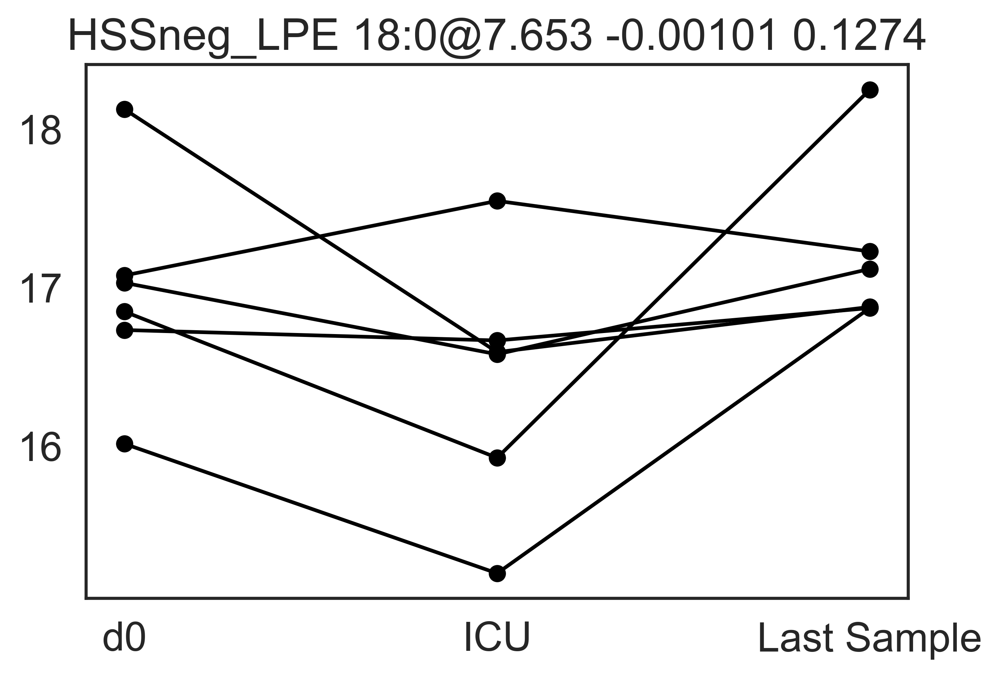

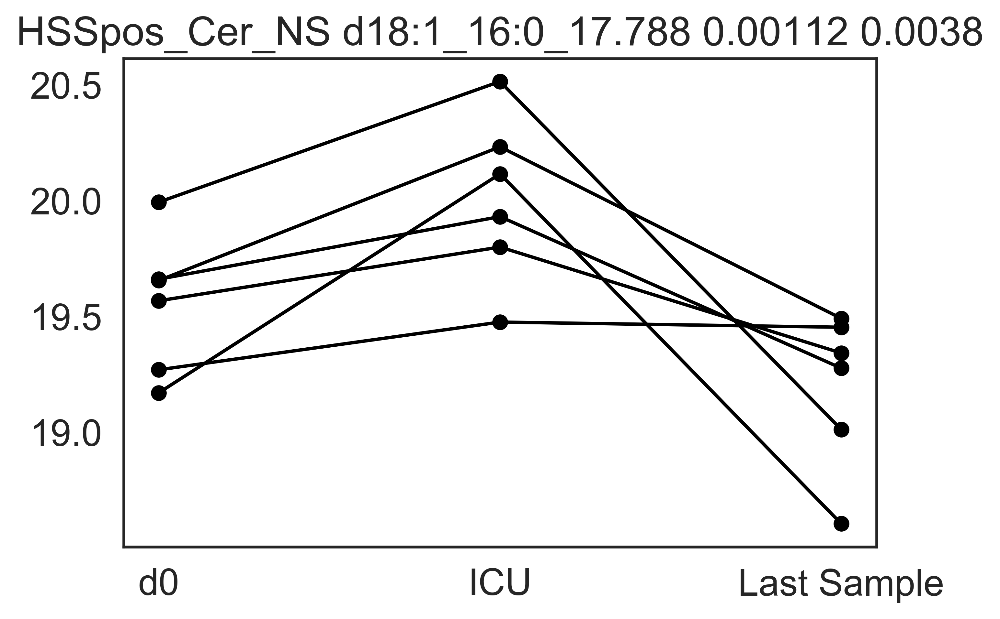

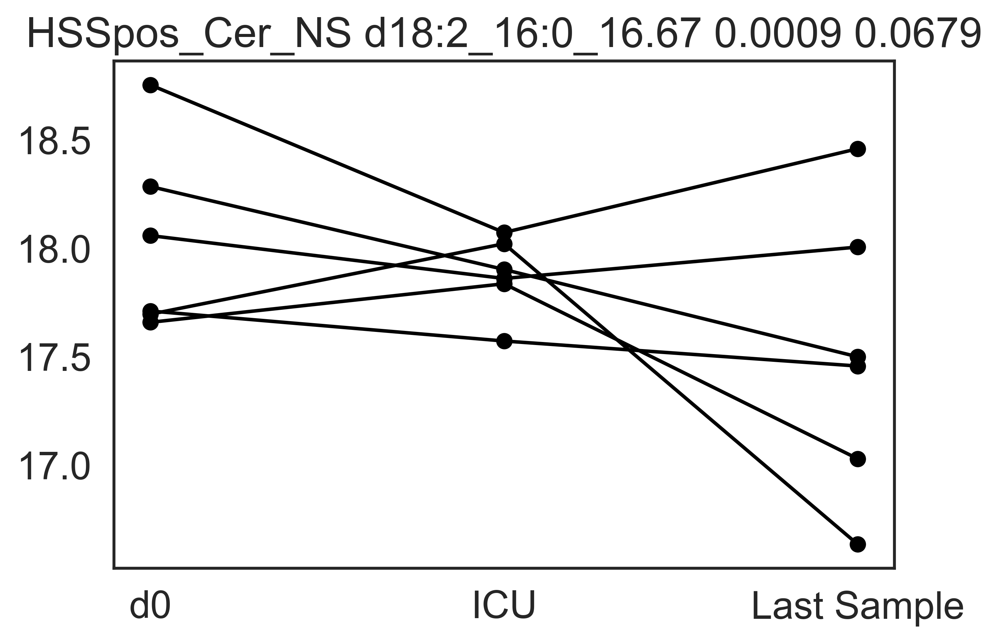

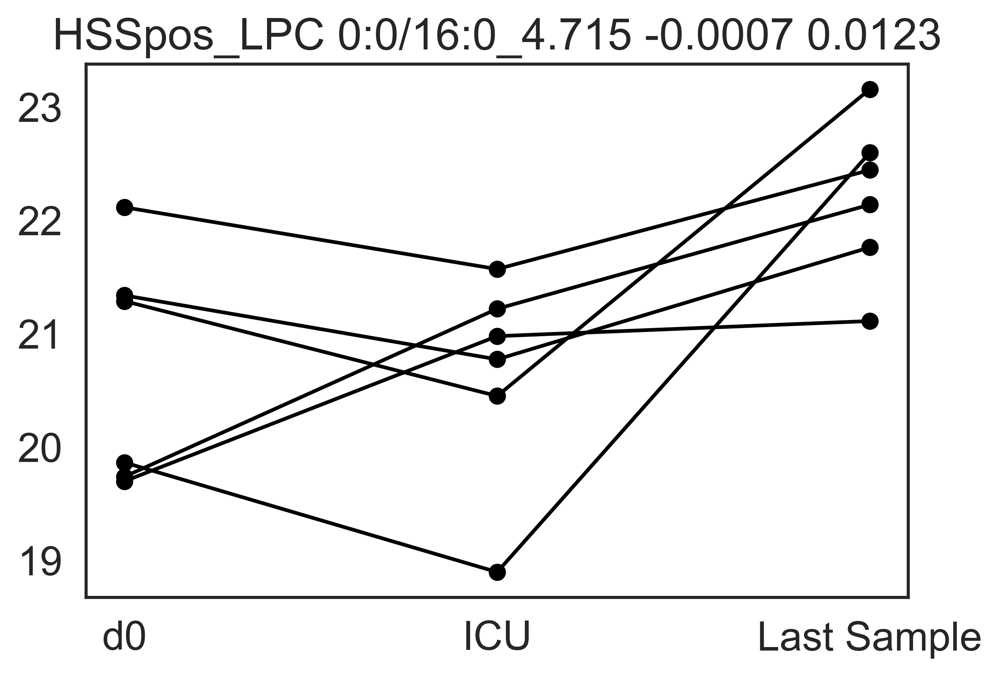

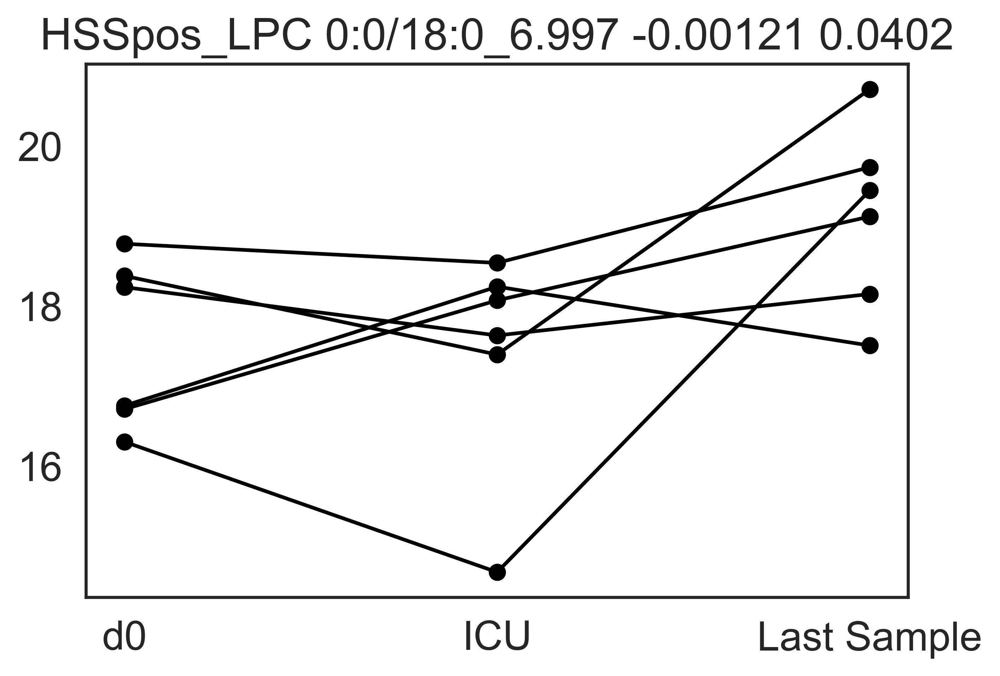

...

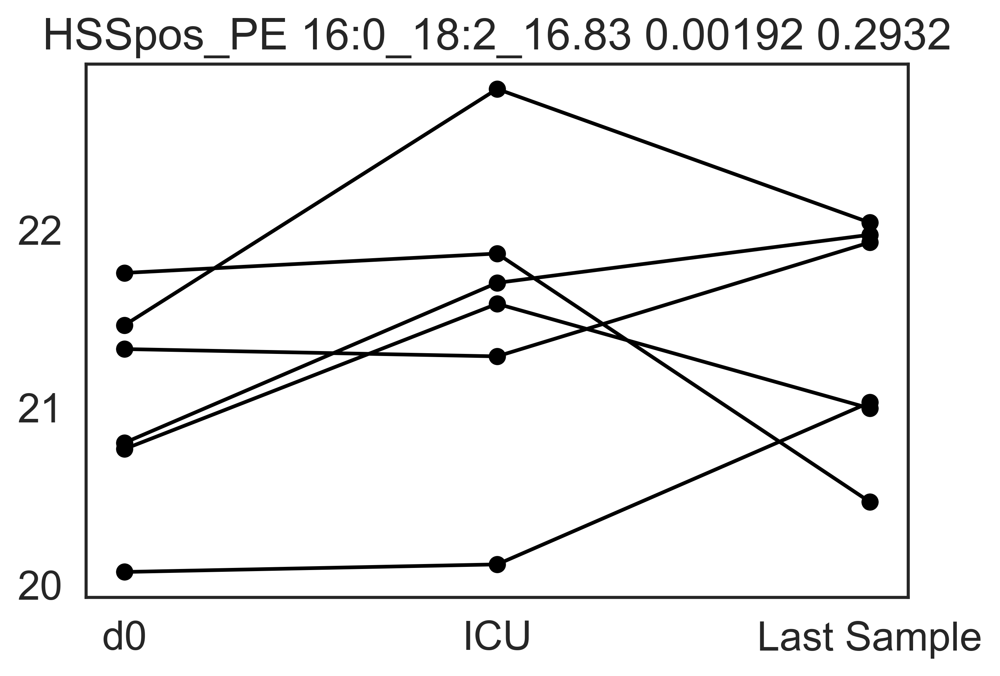

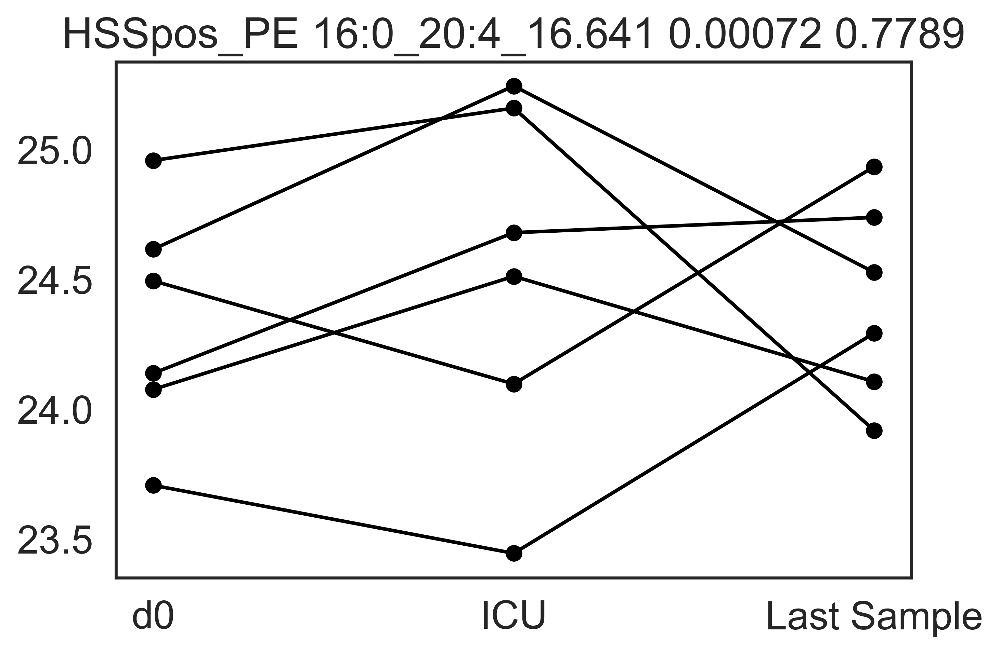

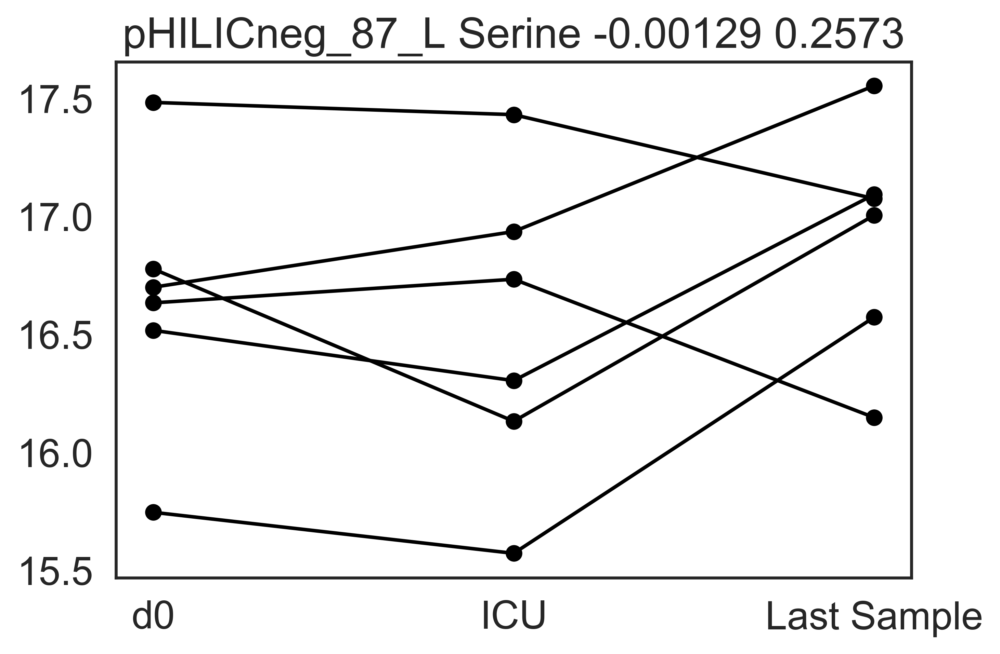

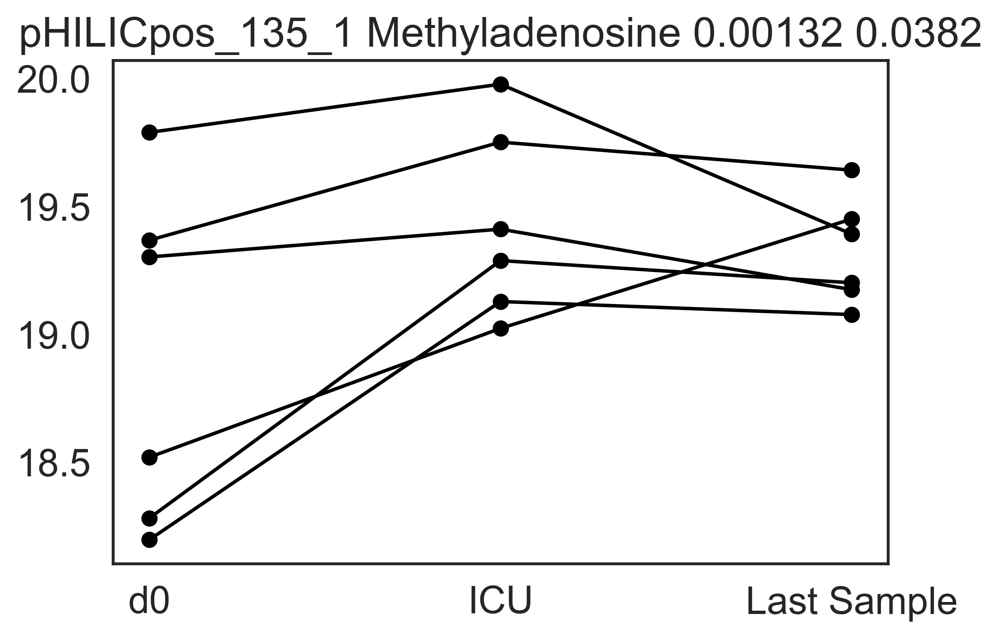

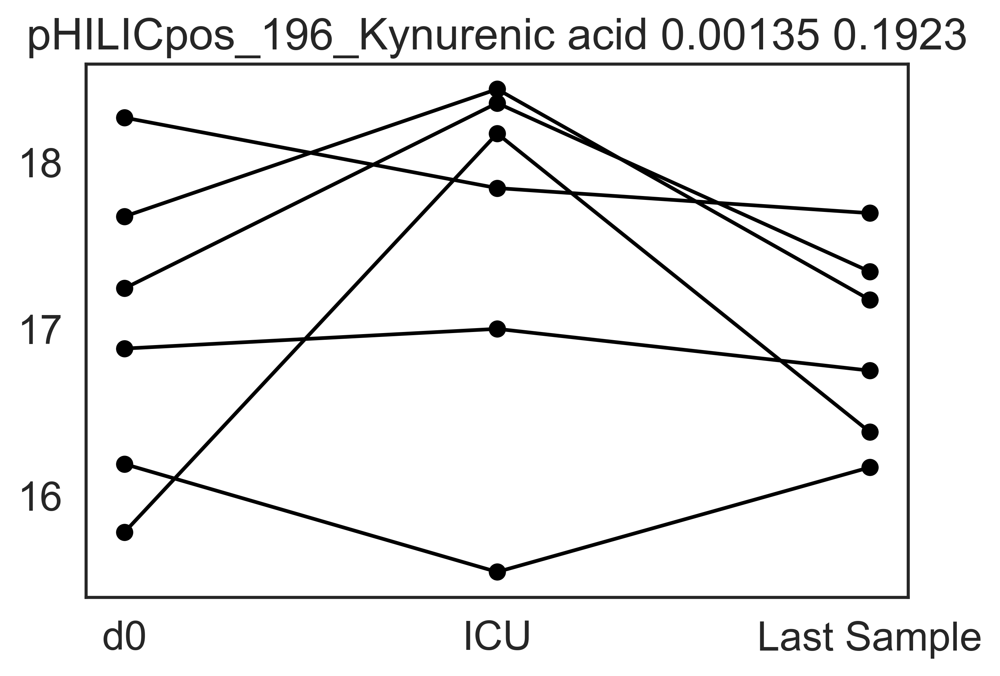

In [20]:
uniquePatients = list(set([x for x in sampleInfoDict["patient"]]))
goodPatients = [x for x in uniquePatients if len([y for y in sampleInfoDict["patient"].values if y == x]) > 2 and measurement_data.at[x,"Any drug"] < .5]
pvals = []
alpha = 0.05
for met in range(len(var_imp)):
    plt.figure()
    starts = []
    icus = []
    ends = []
    for pat in goodPatients:
        relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat]
        times = [row["sample_day"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat]
        ICU = [row["ICU"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0]
        mort = [row["death"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0]
        if ICU and mort == "Alive":
            ICU_day = float([row["Day_to_ICU"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0])
            tmp = samp_int[relsamples,met]
            order = list(range(len(times)))
            order.sort(key=lambda x:times[x])
            tmp = tmp[order]
            #tmp = tmp - tmp[0]
            times = [times[x] for x in order]
            closestTime = times[0]
            err = np.inf
            for x in times:
                if np.abs(x-ICU_day) < err:
                    err = np.abs(x-ICU_day)
                    closestTime = x
            if closestTime != times[0] and closestTime != times[-1]:
                starts.append(tmp[0])
                icus.append(tmp[times.index(closestTime)])
                ends.append(tmp[-1])
                #tmp = tmp - tmp[0]
                plt.plot([0,1,2],[tmp[0],tmp[times.index(closestTime)],tmp[-1]],color="black")
                plt.scatter([0,1,2],[tmp[0],tmp[times.index(closestTime)],tmp[-1]],color="black")
    df = dict()
    ind = 0
    ps = 0
    for s,i,e in zip(starts,icus,ends):
        df[ind] = {"patient":ps,"time":"d0","val":s}
        ind += 1
        df[ind] = {"patient":ps,"time":"ICU","val":i}
        ind += 1
        df[ind] = {"patient":ps,"time":"end","val":e}
        ind += 1
        ps += 1
    p = AnovaRM(data=pd.DataFrame.from_dict(df,orient="index"),depvar="val",subject="patient",within = ["time"]).fit().anova_table["Pr > F"].values[0]
    pvals.append(p)
    plt.title(var_imp.index.values[met] + " " + str(np.round(var_imp.at[var_imp.index.values[met],"var_imp"],5)  ) + " " + str(np.round(p,4)))
    plt.xticks([0,1,2],labels=["d0","ICU","Last Sample"])

reject,pvals_corr,_,_ = multipletests(pvals,alpha,method="fdr_bh")
for name,p in zip(var_imp.index.values,pvals_corr):
    if p < alpha:
        print(name,p)


In [ ]:
# for name,p in zip(var_imp.index.values[met],pvals_corr):
#     if p < alpha/len(var_imp):
#         print(name,p)

In [ ]:
# measurement_data = pd.read_csv("../data/PMN_CRP_d-dimer_CO2_Comorbidities.csv")
# measurement_data

In [ ]:
# plot_df = {}
# for patient in uniquePatients:
#     tmp = measurement_data[measurement_data["Patient"] == patient]
#     stat = sampleInfoDict[sampleInfoDict["patient"]==patient]["ICU"].values[0]
#     if len(tmp) > 0:
#         neut = tmp.at[tmp.index.values[0],"NEUTROPHIL"]
#         neut_per = tmp.at[tmp.index.values[0],"NEUTROPHIL PERCENT (%)"]
#         d = tmp.at[tmp.index.values[0],"D_DIMER"]
#         crp = tmp.at[tmp.index.values[0],"CRP"]
#         if not pd.isna(neut):
#             plot_df[patient] = {"ICU":stat,"NEUTROPHIL (K/cumm)":neut,"NEUTROPHIL (%)":neut_per}

# df = pd.DataFrame.from_dict(plot_df,orient="index")
# sb.boxplot(data=df,x="ICU",y="NEUTROPHIL (K/cumm)")
# sb.swarmplot(data=df,x="ICU",y="NEUTROPHIL (K/cumm)")

# stat,p = stats.ttest_ind(df[df["ICU"]==1]["NEUTROPHIL (K/cumm)"].values,df[df["ICU"]==0]["NEUTROPHIL (K/cumm)"].values,equal_var=False)
# plt.title(str(p))
# plt.figure()
# sb.boxplot(data=df,x="ICU",y="NEUTROPHIL (%)")
# sb.swarmplot(data=df,x="ICU",y="NEUTROPHIL (%)")

# stat,p = stats.ttest_ind(df[df["ICU"]==1]["NEUTROPHIL (%)"].values,df[df["ICU"]==0]["NEUTROPHIL (%)"].values,equal_var=False)
# plt.title(str(p))


In [ ]:
# plot_df = {}
# for patient in uniquePatients:
#     tmp = measurement_data[measurement_data["Patient"] == patient]
#     stat = sampleInfoDict[sampleInfoDict["patient"]==patient]["ICU"].values[0]
#     if len(tmp) > 0:
#         neut = tmp.at[tmp.index.values[0],"NEUTROPHIL"]
#         neut_per = tmp.at[tmp.index.values[0],"NEUTROPHIL PERCENT (%)"]
#         d = tmp.at[tmp.index.values[0],"D_DIMER"]
#         crp = tmp.at[tmp.index.values[0],"CRP"]
#         if not pd.isna(d):
#             d = d.replace(">","").replace("<","")
#             d = float(d)
#             d = np.log2(d)
#             plot_df[patient] = {"ICU":stat,"log2(D_DIMER)":d}

# df = pd.DataFrame.from_dict(plot_df,orient="index")
# sb.boxplot(data=df,x="ICU",y="log2(D_DIMER)")
# sb.swarmplot(data=df,x="ICU",y="log2(D_DIMER)")

# stat,p = stats.ttest_ind(df[df["ICU"]==1]["log2(D_DIMER)"].values,df[df["ICU"]==0]["log2(D_DIMER)"].values,equal_var=False)
# plt.title(str(p))


In [ ]:

# plot_df = {}
# for patient in uniquePatients:
#     tmp = measurement_data[measurement_data["Patient"] == patient]
#     stat = sampleInfoDict[sampleInfoDict["patient"]==patient]["ICU"].values[0]
#     if len(tmp) > 0:
#         neut = tmp.at[tmp.index.values[0],"NEUTROPHIL"]
#         neut_per = tmp.at[tmp.index.values[0],"NEUTROPHIL PERCENT (%)"]
#         d = tmp.at[tmp.index.values[0],"D_DIMER"]
#         crp = tmp.at[tmp.index.values[0],"CRP"]
#         if not pd.isna(crp):
#             #d = d.replace(">","")
#             #d = float(d)
#             #d = np.log2(d)
#             plot_df[patient] = {"ICU":stat,"CRP":crp}

# df = pd.DataFrame.from_dict(plot_df,orient="index")
# sb.boxplot(data=df,x="ICU",y="CRP",palette={1:"red",0,"orange"})
# sb.swarmplot(data=df,x="ICU",y="CRP")

# stat,p = stats.ttest_ind(df[df["ICU"]==1]["CRP"].values,df[df["ICU"]==0]["CRP"].values,equal_var=False)
# plt.title(str(p))


In [ ]:
# plot_df = {}
# for patient in uniquePatients:
#     tmp = measurement_data[measurement_data["Patient"] == patient]
#     stat = sampleInfoDict[sampleInfoDict["patient"]==patient]["ICU"].values[0]
#     if len(tmp) > 0:
#         #if tmp.at[tmp.index.values[0],"Extreme pH"] > .5:
#             neut = tmp.at[tmp.index.values[0],"NEUTROPHIL"]
#             neut_per = tmp.at[tmp.index.values[0],"NEUTROPHIL PERCENT (%)"]
#             d = tmp.at[tmp.index.values[0],"D_DIMER"]
#             crp = tmp.at[tmp.index.values[0],"CRP"]
#             CO2 = tmp.at[tmp.index.values[0],"CO2"]
#             if not pd.isna(CO2):
#                 plot_df[patient] = {"ICU":stat,"CO2":CO2}

# df = pd.DataFrame.from_dict(plot_df,orient="index")
# sb.boxplot(data=df,x="ICU",y="CO2")
# sb.swarmplot(data=df,x="ICU",y="CO2")

# stat,p = stats.ttest_ind(df[df["ICU"]==1]["CO2"].values,df[df["ICU"]==0]["CO2"].values,equal_var=False)
# plt.title(str(p))


In [ ]:

# plot_df = {}
# for patient in uniquePatients:
#     tmp = measurement_data[measurement_data["Patient"] == patient]
#     stat = sampleInfoDict[sampleInfoDict["patient"]==patient]["ICU"].values[0]
#     if len(tmp) > 0:
#         hyp = tmp.at[tmp.index.values[0],"Hypoxia"]
#         dia = tmp.at[tmp.index.values[0],"Diabetes"]
#         kid = tmp.at[tmp.index.values[0],"Kidney Disease"]
#         wl = tmp.at[tmp.index.values[0],"Weight Loss"]
#         can = tmp.at[tmp.index.values[0],"Cancer"]


#         plot_df[patient] = {"ICU":stat,"Hypoxia":hyp,"Diabetes":dia,"Kidney Disease":kid,"Weight Loss":wl,"Cancer":can}

# df = pd.DataFrame.from_dict(plot_df,orient="index")
# posit = 0
# poses = []
# label = []
# for column in ["Hypoxia","Diabetes","Kidney Disease","Weight Loss","Cancer"]:
#     tmp = df[df["ICU"]>.5]
#     pos = len(tmp[tmp[column]>.5])
#     totPos = len(tmp)
#     tmp = df[df["ICU"]<.5]
#     neg = len(tmp[tmp[column]>.5])
#     totNeg = len(tmp)
#     plt.bar([posit,posit+1],[neg/totNeg,pos/totPos],color=["steelblue","darkorange"])
#     label.append(column)
#     poses.append(posit+.5)
#     posit += 3
#     contingency = [[pos,totPos-pos],[neg,totNeg-neg]]
#     _,p = stats.fisher_exact(contingency)
#     print(column,p,contingency)
# plt.xticks(poses,labels=label,rotation=45)
# plt.xlim((min(poses)-1,max(poses)+1))
# plt.ylim((0,1))
# plt.ylabel("Proportion with comorbidity")
# plt.bar([-10],[-10],color="steelblue",label="ICU-")
# plt.bar([-10],[-10],color="darkorange",label="ICU+")
# plt.legend()

In [ ]:

# plot_df = {}
# for patient in uniquePatients:
#     tmp = measurement_data[measurement_data["Patient"] == patient]
#     stat = sampleInfoDict[sampleInfoDict["patient"]==patient]["ICU"].values[0]
#     if len(tmp) > 0:
#         hyp = tmp.at[tmp.index.values[0],"Hypoxia"]
#         dia = tmp.at[tmp.index.values[0],"Diabetes"]
#         kid = tmp.at[tmp.index.values[0],"Kidney Disease"]
#         akid = tmp.at[tmp.index.values[0],"Acute Kidney Disease"]
#         wl = tmp.at[tmp.index.values[0],"Weight Loss"]
#         can = tmp.at[tmp.index.values[0],"Cancer"]
#         ph = tmp.at[tmp.index.values[0],"Extreme pH"]


#         plot_df[patient] = {"Acute Kidney Disease":akid,"ICU":stat,"Hypoxia":hyp,"Diabetes":dia,"Kidney Disease":kid,"Weight Loss":wl,"Cancer":can,"Extreme pH":ph}

# df = pd.DataFrame.from_dict(plot_df,orient="index")
# posit = 0
# poses = []
# label = []
# for column in ["Hypoxia","Diabetes","Kidney Disease","Acute Kidney Disease","Weight Loss","Cancer","Extreme pH"]:
#     tmp = df[df["ICU"]>.5]
#     pos = len(tmp[tmp[column]>.5])
#     totPos = len(tmp)
#     tmp = df[df["ICU"]<.5]
#     neg = len(tmp[tmp[column]>.5])
#     totNeg = len(tmp)
#     plt.bar([posit,posit+1],[neg/totNeg,pos/totPos],color=["steelblue","darkorange"])
#     label.append(column)
#     poses.append(posit+.5)
#     posit += 3
#     contingency = [[pos,totPos-pos],[neg,totNeg-neg]]
#     _,p = stats.fisher_exact(contingency)
#     print(column,p,contingency)
# plt.xticks(poses,labels=label,rotation=45)
# plt.xlim((min(poses)-1,max(poses)+1))
# plt.ylim((0,1))
# plt.ylabel("Proportion with comorbidity")
# plt.bar([-10],[-10],color="steelblue",label="ICU-")
# plt.bar([-10],[-10],color="darkorange",label="ICU+")
# plt.legend()

In [ ]:
# patientsOfInterest = []

In [ ]:
# uniquePatients = list(set([x for x in sampleInfoDict["patient"]]))
# goodPatients = [x for x in uniquePatients if len([y for y in sampleInfoDict["patient"].values if y == x]) > 2 and df.at[x,"Kidney Disease"] == 0]
# for met in range(len(var_imp)):
#     plt.figure()
#     starts = []
#     icus = []
#     ends = []
#     for pat in goodPatients:
#         relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat]
#         times = [row["sample_day"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat]
#         ICU = [row["ICU"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0]
#         mort = [row["death"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0]
#         if ICU and mort == "Alive":
#             ICU_day = float([row["Day_to_ICU"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0])
#             tmp = samp_int[relsamples,met]
#             order = list(range(len(times)))
#             order.sort(key=lambda x:times[x])
#             tmp = tmp[order]
#             #tmp = tmp - tmp[0]
#             times = [times[x] for x in order]
#             closestTime = times[0]
#             err = np.inf
#             for x in times:
#                 if np.abs(x-ICU_day) < err:
#                     err = np.abs(x-ICU_day)
#                     closestTime = x
#             if closestTime != times[0] and closestTime != times[-1]:
#                 starts.append(tmp[0])
#                 icus.append(tmp[times.index(closestTime)])
#                 ends.append(tmp[-1])
#                 #tmp = tmp - tmp[0]
#                 plt.plot([0,1,2],[tmp[0],tmp[times.index(closestTime)],tmp[-1]],color="black")
#                 plt.scatter([0,1,2],[tmp[0],tmp[times.index(closestTime)],tmp[-1]],color="black")
#     dft = dict()
#     ind = 0
#     ps = 0
#     for s,i,e in zip(starts,icus,ends):
#         dft[ind] = {"patient":ps,"time":"d0","val":s}
#         ind += 1
#         dft[ind] = {"patient":ps,"time":"ICU","val":i}
#         ind += 1
#         dft[ind] = {"patient":ps,"time":"end","val":e}
#         ind += 1
#         ps += 1
#     p = AnovaRM(data=pd.DataFrame.from_dict(dft,orient="index"),depvar="val",subject="patient",within = ["time"]).fit().anova_table["Pr > F"].values[0]
#     plt.title(var_imp.index.values[met] + " " + str(np.round(var_imp.at[var_imp.index.values[met],"var_imp"],5)  ) + " " + str(np.round(p,4)))
#     plt.xticks([0,1,2],labels=["d0","ICU","Last Sample"])
    


In [ ]:
# uniquePatients = list(set([x for x in sampleInfoDict["patient"]]))
# goodPatients = [x for x in uniquePatients if len([y for y in sampleInfoDict["patient"].values if y == x]) > 2 and df.at[x,"Hypoxia"] == 0]
# for met in range(len(var_imp)):
#     plt.figure()
#     starts = []
#     icus = []
#     ends = []
#     for pat in goodPatients:
#         relsamples = [row["index"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat]
#         times = [row["sample_day"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat]
#         ICU = [row["ICU"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0]
#         mort = [row["death"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0]
#         if ICU and mort == "Alive":
#             ICU_day = float([row["Day_to_ICU"] for index,row in sampleInfoDict.iterrows() if row["patient"]==pat][0])
#             tmp = samp_int[relsamples,met]
#             order = list(range(len(times)))
#             order.sort(key=lambda x:times[x])
#             tmp = tmp[order]
#             #tmp = tmp - tmp[0]
#             times = [times[x] for x in order]
#             closestTime = times[0]
#             err = np.inf
#             for x in times:
#                 if np.abs(x-ICU_day) < err:
#                     err = np.abs(x-ICU_day)
#                     closestTime = x
#             if closestTime != times[0] and closestTime != times[-1]:
#                 starts.append(tmp[0])
#                 icus.append(tmp[times.index(closestTime)])
#                 ends.append(tmp[-1])
#                 #tmp = tmp - tmp[0]
#                 plt.plot([0,1,2],[tmp[0],tmp[times.index(closestTime)],tmp[-1]],color="black")
#                 plt.scatter([0,1,2],[tmp[0],tmp[times.index(closestTime)],tmp[-1]],color="black")
#     dft = dict()
#     ind = 0
#     ps = 0
#     for s,i,e in zip(starts,icus,ends):
#         dft[ind] = {"patient":ps,"time":"d0","val":s}
#         ind += 1
#         dft[ind] = {"patient":ps,"time":"ICU","val":i}
#         ind += 1
#         dft[ind] = {"patient":ps,"time":"end","val":e}
#         ind += 1
#         ps += 1
#     p = AnovaRM(data=pd.DataFrame.from_dict(dft,orient="index"),depvar="val",subject="patient",within = ["time"]).fit().anova_table["Pr > F"].values[0]
#     plt.title(var_imp.index.values[met] + " " + str(np.round(var_imp.at[var_imp.index.values[met],"var_imp"],5)  ) + " " + str(np.round(p,4)))
#     plt.xticks([0,1,2],labels=["d0","ICU","Last Sample"])
    
